<a target="_blank" href="https://colab.research.google.com/github/andrew-nash/CS6421-labs/blob/main/CS6421_Assignment2.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>


In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

In [ ]:
!pip install wandb -qU
!wget https://github.com/gmprovan/CS6421-Assignment1/raw/master/train.zip
!wget https://github.com/gmprovan/CS6421-Assignment1/raw/master/test.zip
!wget https://github.com/gmprovan/CS6421-Assignment1/raw/master/train_cleaned.zip
!unzip train.zip
!unzip test.zip
!unzip train_cleaned.zip

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 20.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.4/195.4 kB 20.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.6/264.6 kB 24.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.7 MB/s eta 0:00:00
--2024-03-25 17:59:27--  https://github.com/gmprovan/CS6421-Assignment1/raw/master/train.zip
Resolving github.com (github.com)... 20.27.177.113
Connecting to github.com (github.com)|20.27.177.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/gmprovan/CS6421-Assignment1/master/train.zip [following]
--2024-03-25 17:59:28--  https://raw.githubusercontent.com/gmprovan/CS6421-Assignment1/master/train.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133

In [ ]:
%load_ext tensorboard
%tensorboard --logdir tboard

<IPython.core.display.Javascript object>

# Setup

In [ ]:
import tensorflow as tf
import json
from google.colab import files
import numpy as np
from tensorflow.keras.datasets import mnist
from keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import wandb
from keras.preprocessing.image import load_img, array_to_img, img_to_array
from sklearn.model_selection import train_test_split
from pathlib import Path
from wandb.keras import WandbMetricsLogger, WandbModelCheckpoint

def rmse_loss(preds, real):
  return tf.reduce_mean(tf.square(tf.subtract(preds, real)))
class Assignment2:
    def __init__(self):
        self.constraints = cs

    def sample_constraint(self, mod, task, epoch):
        task_constraints = self.constraints[task]
        permitted_layers = task_constraints['permitted_layers']
        layer_limits = task_constraints['layer_limits']
        layer_mins = task_constraints['layer_mins']
        total_param_limit = task_constraints['total_param_limit']
        max_epochs= task_constraints['max_epochs']
        kernel_regularizer = task_constraints['kernel_regularizer']
        bias_regularizer = task_constraints['bias_regularizer']
        activity_regularizer = task_constraints['activity_regularizer']
        regularizers = [ 'kernel_regularizer', 'bias_regularizer','activity_regularizer' ]
        regularizer_allowed = [kernel_regularizer, bias_regularizer, activity_regularizer]
        act_funcs = task_constraints['act_funcs']

        min_lr = task_constraints['min_lr']
        max_lr = task_constraints['max_lr']
        permitted_opts =  task_constraints['optimizers']

        # both trainable and untrainable
        if mod.count_params()>total_param_limit:
            return False, "Too many parameters"
        layer_counts = {}
        config = mod.get_config()
        comp_config = mod.optimizer.get_config()
        if epoch>max_epochs:
            return (False, f"Too many trianing epochs, limit is \'{max_epochs}\'")

        if comp_config['name'] not in permitted_opts:
            return (False, f"Unpermitted Optimizer \'{comp_config['name']}\'")
        if comp_config['learning_rate'] < min_lr and not abs(comp_config['learning_rate'] - min_lr)<1e-5:
            return (False, f"Learning rate {comp_config['learning_rate']} lower than specified minimum \'{min_lr}\'")
        if comp_config['learning_rate'] > max_lr and not abs(comp_config['learning_rate'] - max_lr)<1e-5:
            return (False, f"Learning rate {comp_config['learning_rate']} higher than specified max \'{max_lr}\'")

        for layer in config['layers']:
            l_type = layer['class_name']
            if l_type not in permitted_layers:
                return (False, f"Unpermitted layer type \'{l_type}\'")
            if l_type not in layer_counts: layer_counts[l_type]=0

            layer_counts[l_type]+=1
            if l_type in layer_limits and layer_counts[l_type]>layer_limits[l_type]:
                return (False, f"Limit of \'{l_type}\' layers exceeded")
            if 'activation' in layer['config'] and layer['config']['activation'] not in act_funcs:
              return (False, f"Unpermitted activation function \'{layer['config']['activation']}\'")

            for regularizer, allowed in zip(regularizers,regularizer_allowed):
                if regularizer in layer['config']:
                    if layer['config'][regularizer]!=None and not allowed:
                        return (False, f"Unpermitted regularizer: {regularizer}")
        for l_type in layer_mins:
            if layer_counts[l_type]<layer_mins[l_type]:
                return (False, f"Need to include a minmum of \'{layer_mins[l_type]}\' {l_type} layers")
        return True, "Model satisifes constraints"
    def getTask3SampleImage(self, tpe="train"):
      X = []
      Y = []

      for img in os.listdir("train"):
          img = load_img(f"train/{img}", grayscale=True,target_size=(420,540))
          img = img_to_array(img).astype('float32')/255.
          X.append(img)

      for img in os.listdir("train_cleaned"):
          img = load_img(f"train_cleaned/{img}", grayscale=True,target_size=(420,540))
          img = img_to_array(img).astype('float32')/255.
          Y.append(img)


      X = np.array(X)
      Y = np.array(Y)

      X_train, X_valid, y_train, y_valid = train_test_split(X, Y, test_size=0.1, random_state=111)

      if tpe=='train':
          idx=np.random.choice(list(range(len(X_train))))
          return X_train[idx],y_train[idx]
      else:
        idx=np.random.choice(list(range(len(X_valid))))
        return X_valid[idx],y_valid[idx]

    def trainTaskOne(self, model, run_name,  batch_size, epochs=50):

        (x_train, _), (x_test, _) = mnist.load_data()
        np.random.seed(42)
        np.random.shuffle(x_train)
        split = int(0.75*len(x_train))
        x_valid = x_train[split:,:,:]
        x_train = x_train[:split,:,:]
        x_train = x_train.astype('float32') / 255.
        x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))
        x_valid = x_valid.astype('float32') / 255.
        x_valid = np.reshape(x_valid, (len(x_valid), 28, 28, 1))

        task = "task1"
        project_name = task
        run_name = run_name.strip()
        wandb.init(
        project= project_name,
        name = run_name)
        if not run_name.replace('_','').isalnum():
          raise ValueError("Run name can only contain alphanumeric caracters and _")
        #model.compile(optimizer=optimizer, loss=loss_function)
        callback_ckpt = tf.keras.callbacks.ModelCheckpoint(filepath=task+'/'+task+"_{epoch:03d}",
                                                 save_weights_only=True,
                                                 save_best_only = False,
                                                 monitor="val_loss",
                                                 verbose=1)
        check, msg = self.sample_constraint(model, task, epochs)
        if not check:
          raise ValueError(msg)
        filename=f'{task}/history_log.csv'
        if not os.path.exists(task):
            os.makedirs(task)

        callback_hst = AssignmentSubmissionCallback(filename, x_train,x_train)
        tensorboard_callback = tf.keras.callbacks.TensorBoard(f"./tboard/{project_name}/{run_name}", histogram_freq=1)
        model.fit(x_train,
                x_train,
                batch_size=batch_size,
                epochs=epochs,
                validation_data=(x_valid, x_valid),
                  callbacks=[callback_ckpt,callback_hst,tensorboard_callback,WandbMetricsLogger()], verbose=0)
        model.save(f"./{task}/final_model")
        os.system(f"tar -cf {task}_{run_name}.tar.gz ./{task}")
        files.download(f'{task}_{run_name}.tar.gz')
        wandb.finish()

    def trainTaskTwo(self, model, run_name,  batch_size, epochs=50):
        (x_train, _), (x_test, _) = mnist.load_data()
        np.random.seed(42)
        np.random.shuffle(x_train)
        noise_factor = 0.5
        x_train_noisy = x_train + noise_factor + np.random.normal(loc=0.0, scale=1.0, size=x_train.shape)
        x_train = np.clip(x_train_noisy, 0., 1.)
        split = int(0.75*len(x_train))
        x_valid = x_train[split:,:,:]
        x_train = x_train[:split,:,:]
        x_train = x_train.astype('float32') / 255.
        x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))
        x_valid = x_valid.astype('float32') / 255.
        x_valid = np.reshape(x_valid, (len(x_valid), 28, 28, 1))

        task = "task2"
        project_name = task
        run_name = run_name.strip()
        wandb.init(
        project= project_name,
        name = run_name)
        if not run_name.replace('_','').isalnum():
          raise ValueError("Run name can only contain alphanumeric caracters and _")
        #model.compile(optimizer=optimizer, loss=loss_function)
        callback_ckpt = tf.keras.callbacks.ModelCheckpoint(filepath=task+'/'+task+"_{epoch:03d}",
                                                 save_weights_only=True,
                                                 save_best_only = False,
                                                 monitor="val_loss",
                                                 verbose=1)
        check, msg = self.sample_constraint(model, task, epochs)
        if not check:
          raise ValueError(msg)
        filename=f'{task}/history_log.csv'
        if not os.path.exists(task):
            os.makedirs(task)

        callback_hst = AssignmentSubmissionCallback(filename, x_train,x_train)
        tensorboard_callback = tf.keras.callbacks.TensorBoard(f"./tboard/{project_name}/{run_name}", histogram_freq=1)
        model.fit(x_train,
                x_train,
                batch_size=batch_size,
                epochs=epochs,
                validation_data=(x_valid, x_valid),
                  callbacks=[callback_ckpt,callback_hst,tensorboard_callback,WandbMetricsLogger()], verbose=0)
        model.save(f"./{task}/final_model")
        os.system(f"tar -cf {task}_{run_name}.tar.gz ./{task}")
        files.download(f'{task}_{run_name}.tar.gz')
        wandb.finish()

    def trainTaskThree(self, model, run_name,  batch_size, epochs=50):

        X = []
        Y = []

        for img in os.listdir("train"):
            img = load_img(f"train/{img}", grayscale=True,target_size=(420,540))
            img = img_to_array(img).astype('float32')/255.
            X.append(img)

        for img in os.listdir("train_cleaned"):
            img = load_img(f"train_cleaned/{img}", grayscale=True,target_size=(420,540))
            img = img_to_array(img).astype('float32')/255.
            Y.append(img)


        X = np.array(X)
        Y = np.array(Y)

        X_train, X_valid, y_train, y_valid = train_test_split(X, Y, test_size=0.1, random_state=111)


        task = "task3"
        project_name = task
        run_name = run_name.strip()
        wandb.init(
        project= project_name,
        name = run_name)
        if not run_name.replace('_','').isalnum():
          raise ValueError("Run name can only contain alphanumeric caracters and _")
        #model.compile(optimizer=optimizer, loss=loss_function)
        callback_ckpt = tf.keras.callbacks.ModelCheckpoint(filepath=task+'/'+task+"_{epoch:03d}",
                                                 save_weights_only=True,
                                                 save_best_only = False,
                                                 monitor="val_loss",
                                                 verbose=1)
        check, msg = self.sample_constraint(model, task, epochs)
        if not check:
          raise ValueError(msg)
        filename=f'{task}/history_log.csv'
        if not os.path.exists(task):
            os.makedirs(task)

        callback_hst = AssignmentSubmissionCallback(filename, X_train,y_train)
        tensorboard_callback = tf.keras.callbacks.TensorBoard(f"./tboard/{project_name}/{run_name}", histogram_freq=1)
        model.fit(X_train,
                y_train,
                batch_size=batch_size,
                epochs=epochs,
                validation_data=(X_valid, y_valid),
                  callbacks=[callback_ckpt,callback_hst,tensorboard_callback,WandbMetricsLogger()], verbose=0)
        model.save(f"./{task}/final_model")
        os.system(f"tar -cf {task}_{run_name}.tar.gz ./{task}")
        files.download(f'{task}_{run_name}.tar.gz')
        wandb.finish()

    def setup(self):
      wandb.login()

    def make_sub(self, task, chosen_run1, chosen_run2, just):
      while not os.path.exists(task+'_'+chosen_run1+'.tar.gz'):
          print(f"ERROR: Missing the run! Find the file {task+'_'+chosen_run1}.tar.gz in your downloads, and upload it in the left hand pane and click enter.")
          input()
      while not os.path.exists(task+'_'+chosen_run2+'.tar.gz'):
          print(f"ERROR: Missing the run! Find the file {task+'_'+chosen_run2}.tar.gz in your downloads, and upload it in the left hand pane and click enter.")
          input()

      f=open(f"./explain.txt","w")
      f.write(just)
      f.close()
      os.system(f"tar -cf {task}.tar.gz {task}_{chosen_run1}.tar.gz {task}_{chosen_run2}.tar.gz explain.txt")
      files.download(f'{task}.tar.gz')

    def make_submission_one(self, chosen_run1, chosen_run2, just):
      self.make_sub("task1", chosen_run1, chosen_run2, just)
    def make_submission_two(self, chosen_run1, chosen_run2, just):
      self.make_sub("task2", chosen_run1, chosen_run2, just)
    def make_submission_three(self, chosen_run1, chosen_run2, chosen_run3, just):
      task='task3'
      while not os.path.exists(task+'_'+chosen_run1+'.tar.gz'):
          print(f"ERROR: Missing the run! Find the file {task+'_'+chosen_run1}.tar.gz in your downloads, and upload it in the left hand pane and click enter.")
          input()
      while not os.path.exists(task+'_'+chosen_run2+'.tar.gz'):
          print(f"ERROR: Missing the run! Find the file {task+'_'+chosen_run2}.tar.gz in your downloads, and upload it in the left hand pane and click enter.")
          input()
      while not os.path.exists(task+'_'+chosen_run3+'.tar.gz'):
          print(f"ERROR: Missing the run! Find the file {task+'_'+chosen_run3}.tar.gz in your downloads, and upload it in the left hand pane and click enter.")
          input()

      f=open(f"./explain.txt","w")
      f.write(just)
      f.close()
      os.system(f"tar -cf {task}.tar.gz {task}_{chosen_run1}.tar.gz {task}_{chosen_run2}.tar.gz {task}_{chosen_run3}.tar.gz explain.txt")
      files.download(f'{task}.tar.gz')



class AssignmentSubmissionCallback(tf.keras.callbacks.Callback):
   def __init__(self, filename, x_train, y_train):
        super().__init__()
        self.filename=filename
        self.x_train = x_train
        self.y_train = y_train
        f = open(self.filename, "w")
        f.write("epoch,train_loss,test_loss\n")
        f.close()
   def on_epoch_end(self, epoch, logs=None):
      train_loss = self.model.evaluate(self.x_train, self.y_train, verbose=0)
      if isinstance(train_loss, list): train_loss=train_loss[0]
      test_loss = logs['val_loss']
      f = open(self.filename, "a")
      f.write(f"{epoch},{train_loss},{test_loss}\n")
      f.close()



In [ ]:
cs={
    "task1": {
        "_descrip" : "",
        "permitted_layers" : ["InputLayer","Dense","BatchNormalization","Reshape","Flatten", "Dropout", "Conv2D", "MaxPooling2D", "MaxPooling1D", "UpSampling2D"],
        "optimizers" : ["SGD", "Adam", "Nadam","Adadelta","RMSprop"],
        "act_funcs" : ["relu","leaky_relu","sigmoid","elu","linear"],
        "min_lr" :  0.000001,
        "max_lr" :  0.1,
        "layer_limits" : {
            "Dense" : 30
        },
        "layer_mins" : {
        },
        "max_epochs" : 100,
        "total_param_limit" :100_000_000,
        "kernel_regularizer": True,
        "bias_regularizer": True,
        "activity_regularizer": True
    },
    "task2": {
        "_descrip" : "",
        "permitted_layers" : ["InputLayer","Dense","BatchNormalization","Reshape","Flatten", "Dropout", "Conv2D", "MaxPooling2D", "MaxPooling1D", "UpSampling2D"],
        "optimizers" : ["SGD", "Adam", "Nadam","Adadelta","RMSprop"],
        "act_funcs" : ["relu","leaky_relu","sigmoid","elu","linear"],
        "min_lr" :  0.000001,
        "max_lr" :  0.1,
        "layer_limits" : {
            "Dense" : 30
        },
        "layer_mins" : {
        },
        "max_epochs" : 100,
        "total_param_limit" :100_000_000,
        "kernel_regularizer": True,
        "bias_regularizer": True,
        "activity_regularizer": True
    },
    "task3": {
        "_descrip" : "",
        "permitted_layers" : ["InputLayer","Dense","BatchNormalization","Reshape","Flatten", "Dropout", "Conv2D", "MaxPooling2D", "MaxPooling1D", "UpSampling2D"],
        "optimizers" : ["SGD", "Adam", "Nadam","Adadelta","RMSprop"],
        "act_funcs" : ["relu","leaky_relu","sigmoid","elu","linear"],
        "min_lr" :  0.000001,
        "max_lr" :  0.1,
        "layer_limits" : {
            "Dense" : 30
        },
        "layer_mins" : {
        },
        "max_epochs" : 100,
        "total_param_limit" :100_000_000,
        "kernel_regularizer": True,
        "bias_regularizer": True,
        "activity_regularizer": True
    },
}

# First steps

In [ ]:
A = Assignment2()
A.setup()

<IPython.core.display.Javascript object>

# CS6421 Assignment 2: Autoencoders

 You will be given a tutorial introduction to the deep autoencoder, and will then need to use this model to solve real-world problems focusing on image denoising.


Please submit your work ideally in a clear Jupyter notebook, highlighting the code that you have written. Present the comparisons and explanations of different model performance results in specific detail.

For each assignment, the following text needs to be agreed to:

 By submitting this exam, I declare

(1) that all work of it is my own;

(2) that I did not seek whole or partial solutions for any part of my submission from others; and

(3) that I did not and will not discuss, exchange, share, or publish complete or partial solutions for this exam or any part of it.

## Introduction: Basic Autoencoder
In this assignment, we will create a **simple autoencoder** model using the [TensorFlow subclassing API](https://www.tensorflow.org/guide/keras#model_subclassing). We start with the popular [MNIST dataset](http://yann.lecun.com/exdb/mnist/) (Grayscale images of hand-written digits from 0 to 9).
_[This first section is based on a notebook orignially contributed by: [afagarap](https://github.com/afagarap)]_

"Autoencoding" is a data compression algorithm where the compression and decompression functions are 1) data-specific, 2) lossy, and 3) learned automatically from examples rather than engineered by a human. Additionally, in almost all contexts where the term "autoencoder" is used, the compression and decompression functions are implemented with neural networks.

 1) Autoencoders are _data-specific_, which means that they will only be able to compress data similar to what they have been trained on. This is different from, say, the MPEG-2 Audio Layer III (MP3) compression algorithm, which only holds assumptions about "sound" in general, but not about specific types of sounds. An autoencoder trained on pictures of faces would do a rather poor job of compressing pictures of trees, because the features it would learn would be face-specific.

2) Autoencoders are _lossy_, which means that the decompressed outputs will be degraded compared to the original inputs (similar to MP3 or JPEG compression). This differs from lossless arithmetic compression.

3) Autoencoders are _learned automatically from data examples_, which is a useful property: it means that it is easy to train specialized instances of the algorithm that will perform well on a specific type of input. It doesn't require any new engineering, just appropriate training data.

To build an autoencoder, you need three things: an encoding function, a decoding function, and a distance function between the amount of information loss between the compressed representation of your data and the decompressed representation (i.e. a "loss" function). The encoder and decoder will be chosen to be parametric functions (typically neural networks), and to be differentiable with respect to the distance function, so the parameters of the encoding/decoding functions can be optimize to minimize the reconstruction loss, using Stochastic Gradient Descent.

In general, a neural network is a computational model that is used for finding a function describing the relationship between data features $x$ and its values or labels $y$, i.e. $y = f(x)$.
An autoencoder is specific type of neural network, which consists of encoder and decoder components: (1) the **encoder**, which learns a compressed data representation $z$, and (2) the **decoder**, which reconstructs the data $\hat{x}$ based on its idea $z$ of how it is structured:
$$ z = f\big(h_{e}(x)\big)$$
$$ \hat{x} = f\big(h_{d}(z)\big),$$
where $z$ is the learned data representation by encoder $h_{e}$, and $\hat{x}$ is the reconstructed data by decoder $h_{d}$ based on $z$.

## Setup
We start by importing the libraries and functions that we will need.

In [ ]:
from __future__ import absolute_import, division, print_function, unicode_literals

#try:
  # The %tensorflow_version magic only works in colab.
  # tensorflow_version 2.x
#except Exception:
#  pass
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow.keras.datasets import mnist

print('TensorFlow version:', tf.__version__)
print('Is Executing Eagerly?', tf.executing_eagerly())

TensorFlow version: 2.15.0
Is Executing Eagerly? True


## Autoencoder model

The encoder and decoder are defined as:
$$ z = f\big(h_{e}(x)\big)$$
$$ \hat{x} = f\big(h_{d}(z)\big),$$
where $z$ is the compressed data representation generated by encoder $h_{e}$, and $\hat{x}$ is the reconstructed data generated by decoder $h_{d}$ based on $z$.

<div align="center"><img src="https://github.com/benjaminirving/mlseminars-autoencoders/blob/master/imgs/d1.png?raw=1" width="80%"></div>

In this figure, we take as input an image, and compress that image before decompressing it using a Dense network. We further define a simple model for this below.

### Define an encoder layer

The first component, the **encoder**, is similar to a conventional feed-forward network. However, it's function is not  predicting values (a _regression_ task) or categories (a _classification_ task). Instead, it's function is to learn a compressed data structure  $z$. We can implement the encoder layer as dense layers, as follows:

In [ ]:
class Encoder(tf.keras.layers.Layer):
    def __init__(self, intermediate_dim):
        super(Encoder, self).__init__()
        self.hidden_layer = tf.keras.layers.Dense(units=intermediate_dim, activation=tf.nn.relu)
        self.output_layer = tf.keras.layers.Dense(units=intermediate_dim, activation=tf.nn.relu)

    def call(self, input_features):
        activation = self.hidden_layer(input_features)
        return self.output_layer(activation)

The _encoding_ is done by passing data input $x$ to the encoder's hidden layer $h$ in order to learn the data representation $z = f(h(x))$.

We first create an `Encoder` class that inherits the [`tf.keras.layers.Layer`](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Layer) class to define it as a layer. The compressed layer $z$ is a _component_ of the autoencoder model.

Analyzing the code, the `Encoder` layer is defined to have a single hidden layer of neurons (`self.hidden_layer`) to learn the input features. Then, we connect the hidden layer to a layer (`self.output_layer`) that encodes the learned activations to the lower dimensional layer for $z$.

### Define a decoder layer

The second component, the **decoder**, is also similar to a feed-forward network. However, instead of reducing data to lower dimension, it attempts to reverse the process, i.e. reconstruct the data $\hat{x}$ from its lower dimension representation $z$ to its original dimension.

The _decoding_ is done by passing the lower dimension representation $z$ to the decoder's hidden layer $h$ in order to reconstruct the data to its original dimension $\hat{x} = f(h(z))$. We can implement the decoder layer as follows,

In [ ]:
class Decoder(tf.keras.layers.Layer):
    def __init__(self, intermediate_dim, original_dim):
        super(Decoder, self).__init__()
        self.hidden_layer = tf.keras.layers.Dense(units=intermediate_dim, activation=tf.nn.relu)
        self.output_layer = tf.keras.layers.Dense(units=original_dim, activation=tf.nn.relu)

    def call(self, code):
        activation = self.hidden_layer(code)
        return self.output_layer(activation)

We now create a `Decoder` class that also inherits the `tf.keras.layers.Layer`.

The `Decoder` layer is also defined to have a single hidden layer of neurons to reconstruct the input features $\hat{x}$ from the learned representation $z$ by the encoder $f\big(h_{e}(x)\big)$. Then, we connect its hidden layer to a layer that decodes the data representation from lower dimension $z$ to its original dimension $\hat{x}$. Hence, the "output" of the `Decoder` layer is the reconstructed data $\hat{x}$ from the data representation $z$.

Ultimately, the output of the decoder is the autoencoder's output.

Now that we have defined the components of our autoencoder, we can finally build our model.

### Build the autoencoder model

We can now build the autoencoder model by instantiating `Encoder` and `Decoder` layers.

In [ ]:
class Autoencoder(tf.keras.Model):
  def __init__(self, intermediate_dim, original_dim):
    super(Autoencoder, self).__init__()
    self.loss = []
    self.encoder = Encoder(intermediate_dim=intermediate_dim)
    self.decoder = Decoder(intermediate_dim=intermediate_dim, original_dim=original_dim)

  def call(self, input_features):
    code = self.encoder(input_features)
    reconstructed = self.decoder(code)
    return reconstructed

As discussed above, the encoder's output is the input to the decoder, as it is written above (`reconstructed = self.decoder(code)`).

## Reconstruction error

To learn the compressed layer $z$, we define a loss function over the difference between the input data $x$ and the reconstruction of $x$, which is $\hat{x}$.
We call this comparison the reconstruction error function, a given by the following equation:
$$ L = \dfrac{1}{n} \sum_{i=0}^{n-1} \big(\hat{x}_{i} - x_{i}\big)^{2}$$
where $\hat{x}$ is the reconstructed data while $x$ is the original data.

In [ ]:
def loss(preds, real):
  return tf.reduce_mean(tf.square(tf.subtract(preds, real)))

## Forward pass and optimization

We will write a function for computing the forward pass, and applying a chosen optimization function.

In [ ]:
def train(loss, model, opt, original):
  with tf.GradientTape() as tape:
    preds = model(original)
    reconstruction_error = loss(preds, original)
  gradients = tape.gradient(reconstruction_error, model.trainable_variables)
  gradient_variables = zip(gradients, model.trainable_variables)
  opt.apply_gradients(gradient_variables)

  return reconstruction_error

## The training loop

Finally, we will write a function to run the training loop. This function will take arguments for the model, the optimization function, the loss, the dataset, and the training epochs.

The training loop itself uses a `GradientTape` context defined in `train` for each batch.

In [ ]:
def train_loop(model, opt, loss, dataset, epochs):
  #model.summary()
  for epoch in range(epochs):
    epoch_loss = 0
    for step, batch_features in enumerate(dataset):
      loss_values = train(loss, model, opt, batch_features)
      epoch_loss += loss_values
    model.loss.append(epoch_loss)
    print('Epoch {}/{}. Loss: {}'.format(epoch + 1, epochs, epoch_loss.numpy()))
  model.summary()

## Process the dataset

Now that we have defined our `Autoencoder` class, the loss function, and the training loop, let's import the dataset. We will normalize the pixel values for each example through dividing by maximum pixel value. We shall flatten the examples from 28 by 28 arrays to 784-dimensional vectors.

In [ ]:
(x_train, _), (x_test, _) = mnist.load_data()

x_train = x_train / 255.

x_train = x_train.astype(np.float32)
x_train = np.reshape(x_train, (x_train.shape[0], 784))
x_test = np.reshape(x_test, (x_test.shape[0], 784))

training_dataset = tf.data.Dataset.from_tensor_slices(x_train).batch(256)

## Train the model

Now all we have to do is instantiate the autoencoder model and choose an optimization function, then pass the intermediate dimension and the original dimension of the images.

In [ ]:
model = Autoencoder(intermediate_dim=128, original_dim=784)
opt = tf.keras.optimizers.Adam(learning_rate=1e-2)

train_loop(model, opt, loss, training_dataset, 20)

Epoch 1/20. Loss: 8.837006568908691
Epoch 2/20. Loss: 5.944148063659668
Epoch 3/20. Loss: 5.504044532775879
Epoch 4/20. Loss: 5.159083366394043
Epoch 5/20. Loss: 4.983189582824707
Epoch 6/20. Loss: 4.891618728637695
Epoch 7/20. Loss: 4.813442707061768
Epoch 8/20. Loss: 4.744341850280762
Epoch 9/20. Loss: 4.710423946380615
Epoch 10/20. Loss: 4.671944618225098
Epoch 11/20. Loss: 4.646299839019775
Epoch 12/20. Loss: 4.644344329833984
Epoch 13/20. Loss: 4.616511821746826
Epoch 14/20. Loss: 4.616508960723877
Epoch 15/20. Loss: 4.6132025718688965
Epoch 16/20. Loss: 4.593142032623291
Epoch 17/20. Loss: 4.583707809448242
Epoch 18/20. Loss: 4.582552909851074
Epoch 19/20. Loss: 4.567692756652832
Epoch 20/20. Loss: 4.566687107086182
Model: "autoencoder_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder_2 (Encoder)         multiple                  116992    
                                               

## Plot the in-training performance

Let's take a look at how the model performed during training in a couple of plots.

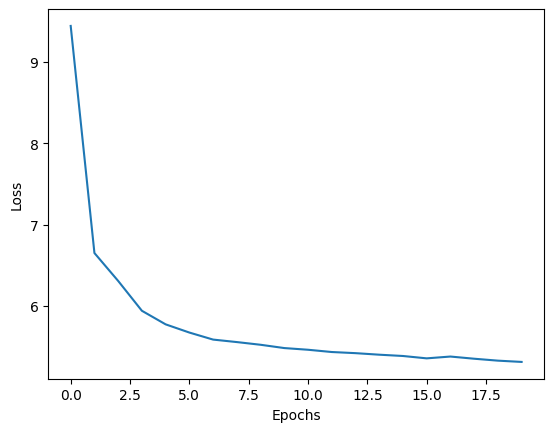

In [ ]:
plt.plot(range(20), model.loss)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

## Predictions

Finally, we will look at some of the reconstructions

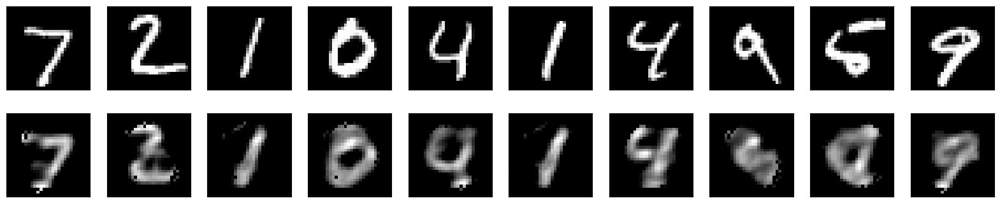

In [ ]:
number = 10  # how many digits we will display
plt.figure(figsize=(20, 4))
for index in range(number):
    # display original
    ax = plt.subplot(2, number, index + 1)
    plt.imshow(x_test[index].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(2, number, index + 1 + number)
    plt.imshow(model(x_test)[index].numpy().reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

## 1. Tasks for Basic Autoencoder Assignment

As you may see after training this model, the reconstructed images are quite blurry. A number of things could be done to move forward from this point, e.g. adding more layers, or using a convolutional neural network architecture as the basis of the autoencoder, or use a different kind of autoencoder.

- generate results for a more complex Dense architecturer
- define more complex CNN  architectures (similar to as described) and compare their performance to that of the Dense models

We are also going to move away from using Keras Sequential() models and introduce the [functional API](https://www.tensorflow.org/guide/keras/functional_api). This becomes important later (oustide the scope of this assignment) for implementing techniques such as residual connections.







In [ ]:
def rmse_loss(preds, real):
  return tf.sqrt(tf.reduce_mean(tf.square(tf.subtract(preds, real))))

In [ ]:
## Task 1 - FINAL DENSE MODEL with 4 layers, number of parameters is 400k, validation losses 0.093 & 0.097 for RMS-prop and Adam optimizers
# Increase in parameters lead to flatlining of loss or GPU crash. Decrease in parameters lead to higher losses due to insuffient training.
input_img = tf.keras.layers.Input(shape=(28, 28, 1))

for opt in ["Adam", "RMSprop"]:
  # flatten the input to a vector
  x = tf.keras.layers.Flatten()(input_img)

  x = tf.keras.layers.Dense(256,activation='relu')(x)
  x = tf.keras.layers.Dense(100,activation='relu')(x)
  # at this point the representation is (4, 4, 8) i.e. 128-dimensional
  x = tf.keras.layers.Dense(256,activation='relu')(x)

  x = tf.keras.layers.Dense(784,activation='relu')(x)
  # turn the final layer back into an image
  x = tf.keras.layers.Reshape((28,28,1))(x)

  autoencoder = tf.keras.models.Model(input_img, x)
  autoencoder.compile(optimizer=opt, loss=rmse_loss)
  autoencoder.summary()

  run_name = "basic_dense_4_layers_{}".format(opt)
  A.trainTaskOne(autoencoder,run_name,32, epochs=30)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense (Dense)               (None, 256)               200960    
                                                                 
 dense_1 (Dense)             (None, 100)               25700     
                                                                 
 dense_2 (Dense)             (None, 256)               25856     
                                                                 
 dense_3 (Dense)             (None, 784)               201488    
                                                                 
 reshape (Reshape)           (None, 28, 28, 1)         0     

wandb: Currently logged in as: 123112200 (abhi-cs6421-lab2). Use `wandb login --relogin` to force relogin



Epoch 1: saving model to task1/task1_001

Epoch 2: saving model to task1/task1_002

Epoch 3: saving model to task1/task1_003

Epoch 4: saving model to task1/task1_004

Epoch 5: saving model to task1/task1_005

Epoch 6: saving model to task1/task1_006

Epoch 7: saving model to task1/task1_007

Epoch 8: saving model to task1/task1_008

Epoch 9: saving model to task1/task1_009

Epoch 10: saving model to task1/task1_010

Epoch 11: saving model to task1/task1_011

Epoch 12: saving model to task1/task1_012

Epoch 13: saving model to task1/task1_013

Epoch 14: saving model to task1/task1_014

Epoch 15: saving model to task1/task1_015

Epoch 16: saving model to task1/task1_016

Epoch 17: saving model to task1/task1_017

Epoch 18: saving model to task1/task1_018

Epoch 19: saving model to task1/task1_019

Epoch 20: saving model to task1/task1_020

Epoch 21: saving model to task1/task1_021

Epoch 22: saving model to task1/task1_022

Epoch 23: saving model to task1/task1_023

Epoch 24: saving mo

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▄▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_loss,█▆▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▁▂▂▂▂▁▁▁▁▁▁▁
epoch/epoch,29
epoch/learning_rate,0.001
epoch/loss,0.09602
epoch/val_loss,0.09727


Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 flatten_1 (Flatten)         (None, 784)               0         
                                                                 
 dense_4 (Dense)             (None, 256)               200960    
                                                                 
 dense_5 (Dense)             (None, 100)               25700     
                                                                 
 dense_6 (Dense)             (None, 256)               25856     
                                                                 
 dense_7 (Dense)             (None, 784)               201488    
                                                                 
 reshape_1 (Reshape)         (None, 28, 28, 1)         0   


Epoch 1: saving model to task1/task1_001

Epoch 2: saving model to task1/task1_002

Epoch 3: saving model to task1/task1_003

Epoch 4: saving model to task1/task1_004

Epoch 5: saving model to task1/task1_005

Epoch 6: saving model to task1/task1_006

Epoch 7: saving model to task1/task1_007

Epoch 8: saving model to task1/task1_008

Epoch 9: saving model to task1/task1_009

Epoch 10: saving model to task1/task1_010

Epoch 11: saving model to task1/task1_011

Epoch 12: saving model to task1/task1_012

Epoch 13: saving model to task1/task1_013

Epoch 14: saving model to task1/task1_014

Epoch 15: saving model to task1/task1_015

Epoch 16: saving model to task1/task1_016

Epoch 17: saving model to task1/task1_017

Epoch 18: saving model to task1/task1_018

Epoch 19: saving model to task1/task1_019

Epoch 20: saving model to task1/task1_020

Epoch 21: saving model to task1/task1_021

Epoch 22: saving model to task1/task1_022

Epoch 23: saving model to task1/task1_023

Epoch 24: saving mo

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▅▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_loss,█▅▅▅▅▄▄▄▃▃▃▃▂▃▂▂▂▃▃▂▃▁▂▁▂▂▂▂▁▂
epoch/epoch,29
epoch/learning_rate,0.001
epoch/loss,0.08443
epoch/val_loss,0.093


Since our inputs are images, it makes sense to try to use convolutional neural networks (CNNs) as encoders and decoders. In practical settings, autoencoders applied to images are always convolutional autoencoders -- they simply perform much better.

- implement a CNN model, where the encoder will consist of a stack of Conv2D and MaxPooling2D layers (max pooling being used for spatial down-sampling), while the decoder will consist in a stack of Conv2D and UpSampling2D layers. To improve the quality of the reconstructed image, we use more filters per layer. Example model details are:

In [ ]:
# Task 1 - CNN - My exp 1 - 4x8 filter configuration, with learning rate 0.001. Validation loss is 0.064
input_img = tf.keras.layers.Input(shape=(28, 28, 1)) # adapt this if using `channels_first` image data format

x = tf.keras.layers.Conv2D(4, (3, 3), activation='relu', padding='same')(input_img)
print(x.shape)
x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
print(x.shape)
x = tf.keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
print(x.shape)
encoded = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
print(encoded.shape)

print("*"*20)
x = tf.keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(encoded)
print(x.shape)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
print(x.shape)
x = tf.keras.layers.Conv2D(4, (3, 3), activation='relu', padding='same')(x)
print(x.shape)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
print(x.shape)
decoded = tf.keras.layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)
print(decoded.shape)

autoencoder = tf.keras.models.Model(input_img, decoded)
autoencoder.compile(optimizer='Adam', loss=rmse_loss)
run_name = "basic_cnn_4_layers_adam"
A.trainTaskOne(autoencoder,run_name,32, epochs=30)

(None, 28, 28, 4)
(None, 14, 14, 4)
(None, 14, 14, 8)
(None, 7, 7, 8)
********************
(None, 7, 7, 8)
(None, 14, 14, 8)
(None, 14, 14, 4)
(None, 28, 28, 4)
(None, 28, 28, 1)



Epoch 1: saving model to task1/task1_001

Epoch 2: saving model to task1/task1_002

Epoch 3: saving model to task1/task1_003

Epoch 4: saving model to task1/task1_004

Epoch 5: saving model to task1/task1_005

Epoch 6: saving model to task1/task1_006

Epoch 7: saving model to task1/task1_007

Epoch 8: saving model to task1/task1_008

Epoch 9: saving model to task1/task1_009

Epoch 10: saving model to task1/task1_010

Epoch 11: saving model to task1/task1_011

Epoch 12: saving model to task1/task1_012

Epoch 13: saving model to task1/task1_013

Epoch 14: saving model to task1/task1_014

Epoch 15: saving model to task1/task1_015

Epoch 16: saving model to task1/task1_016

Epoch 17: saving model to task1/task1_017

Epoch 18: saving model to task1/task1_018

Epoch 19: saving model to task1/task1_019

Epoch 20: saving model to task1/task1_020

Epoch 21: saving model to task1/task1_021

Epoch 22: saving model to task1/task1_022

Epoch 23: saving model to task1/task1_023

Epoch 24: saving mo

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_loss,█▅▄▃▃▃▂▂▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,29
epoch/learning_rate,0.001
epoch/loss,0.06455
epoch/val_loss,0.06481


In [ ]:
autoencoder.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_27 (Conv2D)          (None, 28, 28, 4)         40        
                                                                 
 max_pooling2d_17 (MaxPooli  (None, 14, 14, 4)         0         
 ng2D)                                                           
                                                                 
 conv2d_28 (Conv2D)          (None, 14, 14, 8)         296       
                                                                 
 max_pooling2d_18 (MaxPooli  (None, 7, 7, 8)           0         
 ng2D)                                                           
                                                                 
 conv2d_29 (Conv2D)          (None, 7, 7, 8)           584 

In [ ]:
# TASK 1 - CNN - FINAL MODEL - this time 8x16 filter configuration with lower learning rate of 0.0001. Final validation loss is 0.056
input_img = tf.keras.layers.Input(shape=(28, 28, 1)) # adapt this if using `channels_first` image data format

x = tf.keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(input_img)
print(x.shape)
x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
print(x.shape)
x = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same')(x)
print(x.shape)
encoded = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
print(encoded.shape)

print("*"*20)
x = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same')(encoded)
print(x.shape)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
print(x.shape)
x = tf.keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
print(x.shape)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
print(x.shape)
decoded = tf.keras.layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)
print(decoded.shape)

autoencoder = tf.keras.models.Model(input_img, decoded)
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss=rmse_loss)
autoencoder.summary()
run_name = "basic_cnn_4_layers_adam_8x16_rep1"
A.trainTaskOne(autoencoder,run_name,32, epochs=30)

(None, 28, 28, 8)
(None, 14, 14, 8)
(None, 14, 14, 16)
(None, 7, 7, 16)
********************
(None, 7, 7, 16)
(None, 14, 14, 16)
(None, 14, 14, 8)
(None, 28, 28, 8)
(None, 28, 28, 1)
Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_20 (Conv2D)          (None, 28, 28, 8)         80        
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 14, 14, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_21 (Conv2D)          (None, 14, 14, 16)        1168      
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 7, 7, 16)          0         
 g2D)   


Epoch 1: saving model to task1/task1_001

Epoch 2: saving model to task1/task1_002

Epoch 3: saving model to task1/task1_003

Epoch 4: saving model to task1/task1_004

Epoch 5: saving model to task1/task1_005

Epoch 6: saving model to task1/task1_006

Epoch 7: saving model to task1/task1_007

Epoch 8: saving model to task1/task1_008

Epoch 9: saving model to task1/task1_009

Epoch 10: saving model to task1/task1_010

Epoch 11: saving model to task1/task1_011

Epoch 12: saving model to task1/task1_012

Epoch 13: saving model to task1/task1_013

Epoch 14: saving model to task1/task1_014

Epoch 15: saving model to task1/task1_015

Epoch 16: saving model to task1/task1_016

Epoch 17: saving model to task1/task1_017

Epoch 18: saving model to task1/task1_018

Epoch 19: saving model to task1/task1_019

Epoch 20: saving model to task1/task1_020

Epoch 21: saving model to task1/task1_021

Epoch 22: saving model to task1/task1_022

Epoch 23: saving model to task1/task1_023

Epoch 24: saving mo

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_loss,█▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,29
epoch/learning_rate,0.0001
epoch/loss,0.05609
epoch/val_loss,0.05595



- train the model for 50 epochs and compare the results to the model where you use a dense encoding rather than convolutions.

**Scoring**: 10 marks total
- models [5 marks]:
  - Dense, multi-layer model
  - CNN complex model
- results and discussion [5 marks]: present the results in a clear fashion and explain why the results were as obtained. Good experimental design and statistical significance testing will be rewarded.

Submit your best Dense and CNN based models, as well as well as the explanation of results.

In [ ]:
''' SUBMISSION '''
bestDenseModel = 'basic_dense_4_layers_Adam' #file too big, 160 MB. screenshot ready
bestCNNModel = 'basic_cnn_4_layers_adam_8x16_rep1' #weights only 2MB
explanation = '''
For both dense and CNN based autoencoder models, batch size is kept the same here in this task to help with better comparison. The Adam optimiser
performed slightly better than the given default choice of 'adadelta' with lower validation loss.
The basic 4 dense layer ('basic_dense_4_layers_Adam') model with adam optimiser (256x100x256x784 config) has approximately 454,000 parameters and provided a validation loss
of 0.097. Any increase in number of dense layers increased the number of parameters beyond limit and occupied too much memory for training.
A decrease in both number of parameters with a 4 layer model resulted in an increase in validation loss as lesser the parameters, the lesser
the information learnt by the model while training.
In comparison, the CNN models (4x8 and 8x16 filter configurations, adam optimiser) with different learning rates (0.001 & 0.0001) has
only 1249 and 4801 parameters respectively and still achieved a validation loss of 0.06 and 0.055 respectively. Symmetry is followed
for CNN autoencoder structure. Learning rate for 8x16 model was reduced to 0.001 as the loss flatlined for 0.001 learning rate and
training wasn't happening. 8x16 model has more trainable parameters due to increased number of filters used. So, it
('basic_cnn_4_layers_adam_8x16_rep1') yielded a lesser validation loss and it still has 1/100th of the number of parameters
compared to the dense layers model. Maxpooling is a vital layer in autoencoders as it reduces the spatial dimensions while still
retaining important features leading to computational efficiency.
Overall, this practical implementation is testament to the fact that CNN's feature maps are robust in capturing relevant information better
than the dense model in an efficient manner with significantly lesser number of parameters. Also theoretically, dense models don't perform
well with augmented images while CNN models do. So CNN based model ('basic_cnn_4_layers_adam_8x16_rep1') is the better choice here.

All Wandb screenshots for Task 1 are attached in this jupyter notebook.
Weights File for task1 dense models is 165MB. So, Details for tar files for task1 are provided in tar_files_links.pdf file.
'''

A.make_submission_one(bestDenseModel, bestCNNModel, explanation)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## TASK 1 - BEST DENSE MODEL

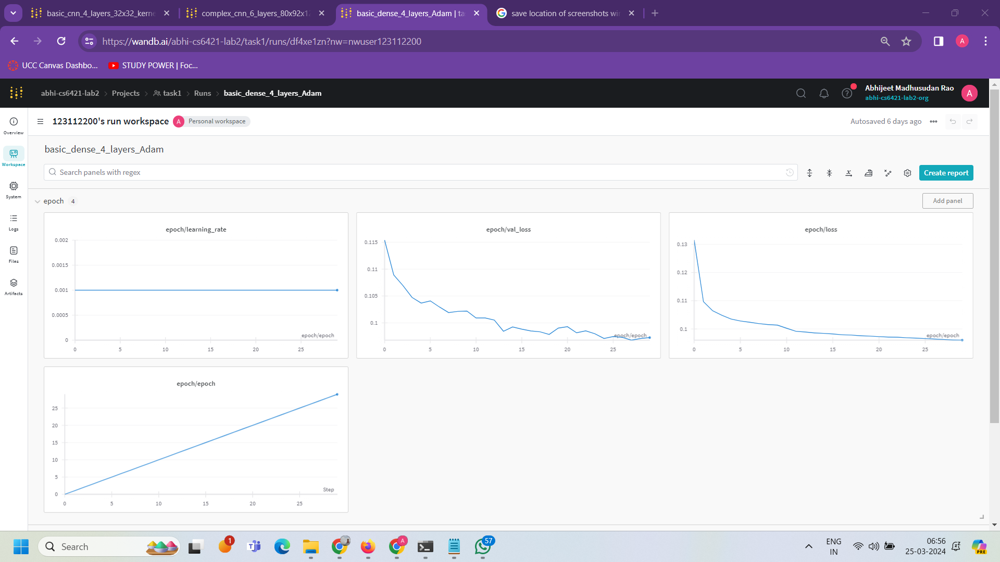

## TASK 1 - BEST CNN MODEL

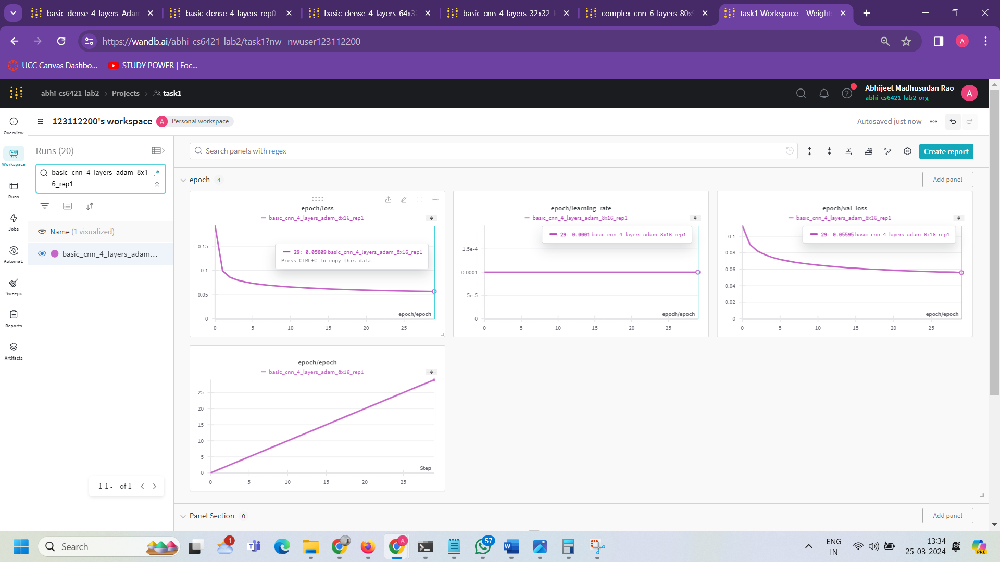

## 2. Denoising autoencoder

For this real-world application, we will use an autoencoder to remove noise from an image. To do this, we

- learn a more robust representation by forcing the autoencoder to learn an input from a corrupted version of itself

<div align="center"><img src="https://github.com/benjaminirving/mlseminars-autoencoders/blob/master/imgs/d3.png?raw=1" width="60%"></div>

The first step: generate synthetic noisy digits as follows: apply a gaussian noise matrix and clip the images between 0 and 1.

This code will be handled within the Assignment class - but is also illustrated below for your own learning



In [ ]:

(x_train, _), (x_test, _) = mnist.load_data()

x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.
x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))
x_test = np.reshape(x_test, (len(x_test), 28, 28, 1))

# Introduce noise with a probability factor of 0.5
noise_factor = 0.5
x_train_noisy = x_train + noise_factor + np.random.normal(loc=0.0, scale=1.0, size=x_train.shape)
x_test_noisy = x_test + noise_factor + np.random.normal(loc=0.0, scale=1.0, size=x_test.shape)

x_train_noisy = np.clip(x_train_noisy, 0., 1.)
x_test_noisy = np.clip(x_test_noisy, 0., 1.)

Next, plot some figures to see what the digits look like with noise added.

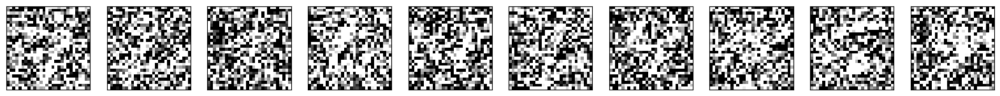

In [ ]:
# Plot figures to show what the noisy digits look like
n = 10
plt.figure(figsize=(20, 2))
for i in range(n):
    ax = plt.subplot(1, n, i + 1)
    plt.imshow(x_test_noisy[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

## Models
- Train CNN and Dense model for 50 epochs and compare the results to the model where you use a dense encoding rather than convolutions. Identify the best configurations for each, and explain their differences in performance.

In [ ]:
def rmse_loss(preds, real):
  return tf.sqrt(tf.reduce_mean(tf.square(tf.subtract(preds, real))))

In [ ]:
# Task 2 - Final Dense model lifted from Task 1. Validation loss is 0.00166

input_img = tf.keras.layers.Input(shape=(28, 28, 1))

# flatten the input to a vector
x = tf.keras.layers.Flatten()(input_img)

x = tf.keras.layers.Dense(256,activation='relu')(x)

x = tf.keras.layers.Dense(100,activation='relu')(x)

# at this point the representation is (4, 4, 8) i.e. 128-dimensional

x = tf.keras.layers.Dense(256,activation='relu')(x)

x = tf.keras.layers.Dense(784,activation='relu')(x)
# turn the final layer back into an image
x = tf.keras.layers.Reshape((28,28,1))(x)

autoencoder = tf.keras.models.Model(input_img, x)
autoencoder.compile(optimizer='Adam', loss=rmse_loss)
autoencoder.summary()

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 flatten_2 (Flatten)         (None, 784)               0         
                                                                 
 dense_8 (Dense)             (None, 256)               200960    
                                                                 
 dense_9 (Dense)             (None, 100)               25700     
                                                                 
 dense_10 (Dense)            (None, 256)               25856     
                                                                 
 dense_11 (Dense)            (None, 784)               201488    
                                                                 
 reshape_2 (Reshape)         (None, 28, 28, 1)         0   

In [ ]:
# This will train for 50 epochs
run_name = "basic_dense_4_layers_rep0"
A.trainTaskTwo(autoencoder,run_name,128, epochs=50)

epoch/epoch,▁█
epoch/learning_rate,▁▁
epoch/loss,█▁
epoch/val_loss,█▁
epoch/epoch,1
epoch/learning_rate,0.001
epoch/loss,0.00166
epoch/val_loss,0.00165



Epoch 1: saving model to task2/task2_001

Epoch 2: saving model to task2/task2_002

Epoch 3: saving model to task2/task2_003

Epoch 4: saving model to task2/task2_004

Epoch 5: saving model to task2/task2_005

Epoch 6: saving model to task2/task2_006

Epoch 7: saving model to task2/task2_007

Epoch 8: saving model to task2/task2_008

Epoch 9: saving model to task2/task2_009

Epoch 10: saving model to task2/task2_010

Epoch 11: saving model to task2/task2_011

Epoch 12: saving model to task2/task2_012

Epoch 13: saving model to task2/task2_013

Epoch 14: saving model to task2/task2_014

Epoch 15: saving model to task2/task2_015

Epoch 16: saving model to task2/task2_016

Epoch 17: saving model to task2/task2_017

Epoch 18: saving model to task2/task2_018

Epoch 19: saving model to task2/task2_019

Epoch 20: saving model to task2/task2_020

Epoch 21: saving model to task2/task2_021

Epoch 22: saving model to task2/task2_022

Epoch 23: saving model to task2/task2_023

Epoch 24: saving mo

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▄▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_loss,█▅▃▂▂▂▂▁▂▂▁▁▁▂▂▁▂▁▁▁▂▂▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁
epoch/epoch,49
epoch/learning_rate,0.001
epoch/loss,0.00162
epoch/val_loss,0.00162


In [ ]:
# Task 2 - Final CNN model lifted from Task 1. Validation loss is 0.00157

input_img = tf.keras.layers.Input(shape=(28, 28, 1)) # adapt this if using `channels_first` image data format

x = tf.keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(input_img)
x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
x = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same')(x)
encoded = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)


# at this point the representation is (4, 4, 8) i.e. 128-dimensional

x = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same')(encoded)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
x = tf.keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
decoded = tf.keras.layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

autoencoder = tf.keras.models.Model(input_img, decoded)
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss=rmse_loss)

In [ ]:
# This will train for 50 epochs
run_name = "basic_cnn_4_layers_8x16_rep2"
A.trainTaskTwo(autoencoder,run_name,128, epochs=50)

11490434/11490434 [==============================] - 0s 0us/step



Epoch 1: saving model to task2/task2_001

Epoch 2: saving model to task2/task2_002

Epoch 3: saving model to task2/task2_003

Epoch 4: saving model to task2/task2_004

Epoch 5: saving model to task2/task2_005

Epoch 6: saving model to task2/task2_006

Epoch 7: saving model to task2/task2_007

Epoch 8: saving model to task2/task2_008

Epoch 9: saving model to task2/task2_009

Epoch 10: saving model to task2/task2_010

Epoch 11: saving model to task2/task2_011

Epoch 12: saving model to task2/task2_012

Epoch 13: saving model to task2/task2_013

Epoch 14: saving model to task2/task2_014

Epoch 15: saving model to task2/task2_015

Epoch 16: saving model to task2/task2_016

Epoch 17: saving model to task2/task2_017

Epoch 18: saving model to task2/task2_018

Epoch 19: saving model to task2/task2_019

Epoch 20: saving model to task2/task2_020

Epoch 21: saving model to task2/task2_021

Epoch 22: saving model to task2/task2_022

Epoch 23: saving model to task2/task2_023

Epoch 24: saving mo

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,49
epoch/learning_rate,0.0001
epoch/loss,0.00157
epoch/val_loss,0.00157


**Scoring**: 10 marks total
- models [5 marks]:
  - Dense, multi-layer model
  - CNN complex model
- results and discussion [5 marks]: present the results in a clear fashion and explain why the results were as obtained. Good experimental design and statistical significance testing will be rewarded.

In [ ]:
''' SUBMISSION '''
bestDenseModel = 'basic_dense_4_layers_rep0' #file 260MB, will try to upload. screenshot ready in case.
bestCNNModel = 'basic_cnn_4_layers_8x16_rep2' #weights only 22MB, uploaded
explanation = '''
The best Dense layer based autoencoder model and the best CNN autoencoder model from task1 were taken and were run for 50 epochs. the former
has 4 dense layers and the latter has 4 convolution based layers respectively.
They were run more than once in the background to ensure results weren't obtained randomly. The same configuration for both dense layers
based and CNN based autoencoder were run 3 times and even though similar results were obtained the best run was picked. In this case,
the first run (rep0) of dense layer model ('basic_dense_4_layers_rep0') was picked as the best dense model and the last run (rep2) for
CNN based model ('basic_cnn_4_layers_8x16_rep2') was picked as the best CNN model.
Both models here achieved a very similar validation loss when run till 50 epochs, however to be very critical CNN based model edged
ahead with a val_loss of 0.00157 in comparison to dense layer based model's val_loss of 0.00162. Also, it converged to this value within
15 epochs whereas the dense layer model was a bit less smoother with occassional minute increases in loss during training. One more major fact
to include is the number of trainable parameters. CNN model has only 4801 parameters while Dense layer model has 454,000 parameters.
So, a very shallow CNN model is equalling or even much more powerful compared to a Deep Dense layer autoencoder as it's able to train better
and with lesser parameters. Hence, CNN model is more computationally efficient and also yielded better results in validation loss.
Out of the two, The best model here is clearly the CNN based autoencoder model - 'basic_cnn_4_layers_8x16_rep2'.

Weights file for best Dense model is 265MB in size. All wandb screenshots for task 2 is attached in this jupyter notebook.
Since file size is large it's too slow in generating tar file.
So, Details for tar files for task2 are provided in tar_files_links.pdf file.
'''

A.make_submission_two(bestDenseModel, bestCNNModel, explanation)

## TASK 2 - BEST DENSE MODEL

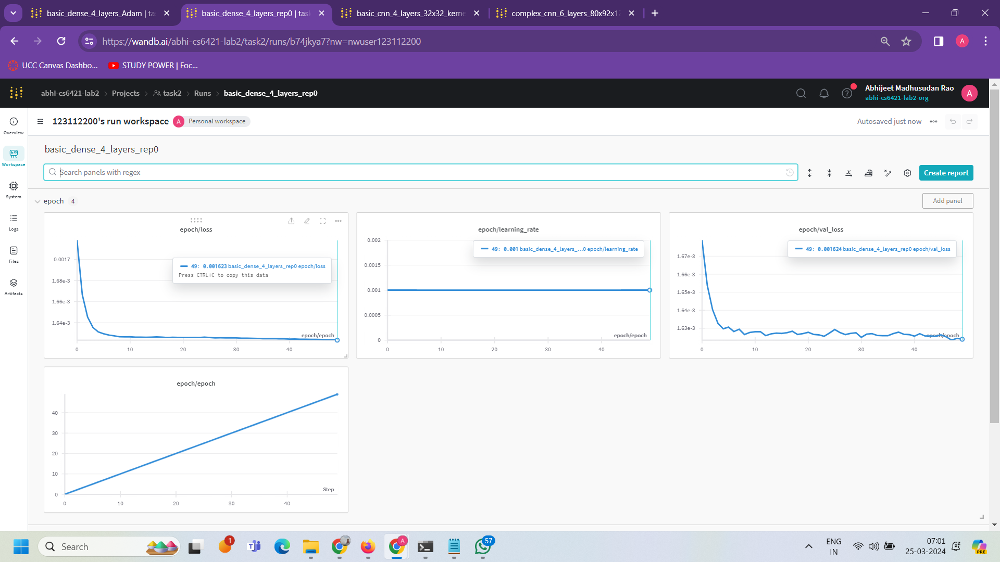

## TASK 2 - BEST CNN MODEL

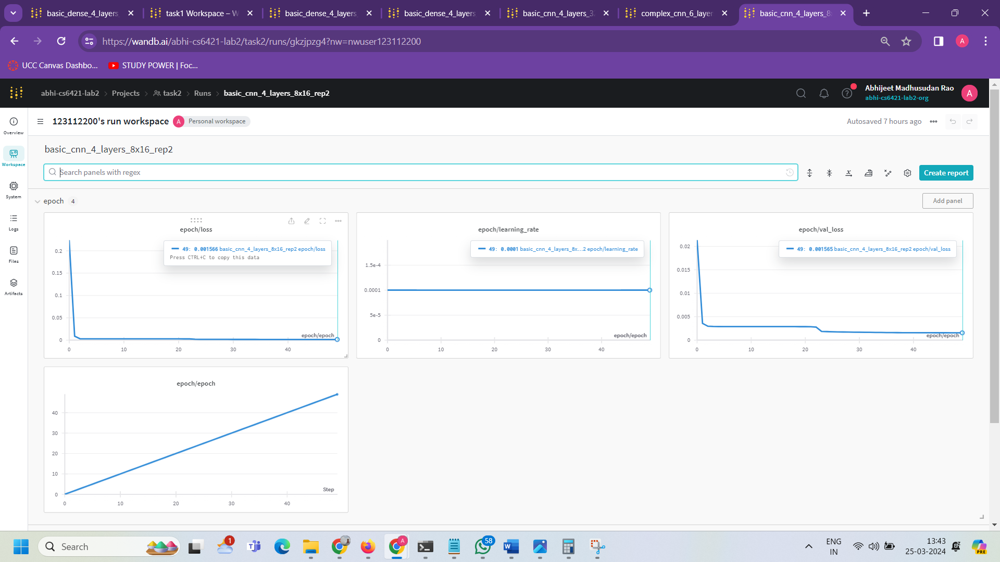

**3. Text Reconstruction Application**

You will now use the approach just described to reconstruct corrupted text. We will use a small dataset with grey-scale images of size $420 \times 540$.  The steps required are as follows:

- Apply this autoencoder approach (as just described) to the text data provided as noted below.
- You must create an algorithm to clean the images in the test set, and report the error as RMSE (root-mean-square error).

**Scoring**: 40 marks total
- models [25 marks]:
  - Dense, multi-layer model [5 marks];
  - CNN basic model [5 marks];
  - CNN complex model [15 marks].
- results and discussion [15 marks]: present the results in a clear fashion and explain why the results were as obtained. Good experimental design and statistical significance testing will be rewarded.


You will get full marks if you achieve RMSE < 0.005. Deductions are as follows:
- -1: 0.01 $\leq$ RMSE $\leq$ 0.005
- -5: 0.05 $\leq$ RMSE $\leq$ 0.01
- -10:  RMSE $>$ 0.05

Deductions are made if **none** of your models attain the speecifid RMSE losses above



Next you must build the model. I provide the code framework, with the model details left up to you.

In [ ]:
# DENSE - FINAL MODEL - Only model as either number of parameters exceeds limit or google colab crashes.
# Final validation loss is 0.44. Loss flatlines after 10 epochs.

input_img = tf.keras.layers.Input(shape=(420, 540, 1))

# flatten the input to a vector
x = tf.keras.layers.Flatten()(input_img)
print(x.shape)
#enoder
# enter encoder model here
x = tf.keras.layers.Dense(64,activation='relu')(x)

x = tf.keras.layers.Dense(32,activation='relu')(x)

#decoder
# enter decoder model model
x = tf.keras.layers.Dense(64,activation='relu')(x)

x = tf.keras.layers.Dense(420*540,activation='relu')(x)

# turn the final layer back into an image
x = tf.keras.layers.Reshape((420,540,1))(x)

autoencoder = tf.keras.models.Model(input_img, x)
autoencoder.compile(optimizer='Adam', loss=rmse_loss)
autoencoder.summary()

# This will train for 50 epochs
run_name = "basic_dense_4_layers_64x32_ep15_final" #epochs 15, Anything above this Google colab crashes or loss doesnt drop below ~0.45, epcohs 50 loss goes to 0.4 but too slow. not worth computing. weights alone are 15GB!
A.trainTaskThree(autoencoder,run_name, 128, epochs=15)

(None, 226800)
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 420, 540, 1)]     0         
                                                                 
 flatten (Flatten)           (None, 226800)            0         
                                                                 
 dense (Dense)               (None, 64)                14515264  
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 64)                2112      
                                                                 
 dense_3 (Dense)             (None, 226800)            14742000  
                                                                 
 reshape (Reshape)           (None, 420, 540, 

/usr/local/lib/python3.10/dist-packages/keras/src/utils/image_utils.py:409: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn(



Epoch 1: saving model to task3/task3_001

Epoch 2: saving model to task3/task3_002

Epoch 3: saving model to task3/task3_003

Epoch 4: saving model to task3/task3_004

Epoch 5: saving model to task3/task3_005

Epoch 6: saving model to task3/task3_006

Epoch 7: saving model to task3/task3_007

Epoch 8: saving model to task3/task3_008

Epoch 9: saving model to task3/task3_009

Epoch 10: saving model to task3/task3_010

Epoch 11: saving model to task3/task3_011

Epoch 12: saving model to task3/task3_012

Epoch 13: saving model to task3/task3_013

Epoch 14: saving model to task3/task3_014

Epoch 15: saving model to task3/task3_015


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

epoch/epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▄▃▃▂▂▂▁▁▁▁▁▁▁▁
epoch/val_loss,█▇▆▄▄▃▂▂▂▂▂▁▁▁▁
epoch/epoch,14
epoch/learning_rate,0.001
epoch/loss,0.43785
epoch/val_loss,0.44302


In [ ]:
## BASIC CNN - Exp 1 - 4 layers with 8x16 filter configuration, validation loss is 0.23
input_img = tf.keras.layers.Input(shape=(420,540,1)) # adapt this if using `channels_first` image data format

x = tf.keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same')(input_img)
print(x.shape)
x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
print(x.shape)
x = tf.keras.layers.Conv2D(16, (5, 5), activation='relu', padding='same')(x)
print(x.shape)
encoded = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
print(encoded.shape)


print("*"*20)
x = tf.keras.layers.Conv2D(16, (5, 5), activation='relu', padding='same')(encoded)
print(x.shape)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
print(x.shape)
x = tf.keras.layers.Conv2D(8, (3, 3), activation='relu', padding = 'same')(x)
print(x.shape)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
print(x.shape)
decoded = tf.keras.layers.Conv2D(1, (2, 2), activation='sigmoid', padding='same')(x)
print(decoded.shape)

autoencoder = tf.keras.models.Model(input_img, decoded)
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=rmse_loss)
#autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.005), loss=rmse_loss)
#autoencoder.compile(optimizer='Adam', loss=rmse_loss)
autoencoder.summary()


# This will train for 50 epochs
run_name = "basic_cnn_4_layers_8x16_kernel3x5_rep1"
A.trainTaskThree(autoencoder,run_name, 128, epochs=50)

(None, 420, 540, 8)
(None, 210, 270, 8)
(None, 210, 270, 16)
(None, 105, 135, 16)
********************
(None, 105, 135, 16)
(None, 210, 270, 16)
(None, 210, 270, 8)
(None, 420, 540, 8)
(None, 420, 540, 1)
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 420, 540, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 420, 540, 8)       80        
                                                                 
 max_pooling2d (MaxPooling2  (None, 210, 270, 8)       0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 210, 270, 16)      3216      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 105, 135, 16)     

/usr/local/lib/python3.10/dist-packages/keras/src/utils/image_utils.py:409: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn(
wandb: Currently logged in as: 123112200 (abhi-cs6421-lab2). Use `wandb login --relogin` to force relogin



Epoch 1: saving model to task3/task3_001

Epoch 2: saving model to task3/task3_002

Epoch 3: saving model to task3/task3_003

Epoch 4: saving model to task3/task3_004

Epoch 5: saving model to task3/task3_005

Epoch 6: saving model to task3/task3_006

Epoch 7: saving model to task3/task3_007

Epoch 8: saving model to task3/task3_008

Epoch 9: saving model to task3/task3_009

Epoch 10: saving model to task3/task3_010

Epoch 11: saving model to task3/task3_011

Epoch 12: saving model to task3/task3_012

Epoch 13: saving model to task3/task3_013

Epoch 14: saving model to task3/task3_014

Epoch 15: saving model to task3/task3_015

Epoch 16: saving model to task3/task3_016

Epoch 17: saving model to task3/task3_017

Epoch 18: saving model to task3/task3_018

Epoch 19: saving model to task3/task3_019

Epoch 20: saving model to task3/task3_020

Epoch 21: saving model to task3/task3_021

Epoch 22: saving model to task3/task3_022

Epoch 23: saving model to task3/task3_023

Epoch 24: saving mo

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▇▅▃▂▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/val_loss,█▆▄▂▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,49
epoch/learning_rate,0.001
epoch/loss,0.23332
epoch/val_loss,0.22613


In [ ]:
## BASIC CNN - Exp 2 - 4 layers with 16x16 configuration, validation loss is 0.05
input_img = tf.keras.layers.Input(shape=(420,540,1)) # adapt this if using `channels_first` image data format

x = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
print(x.shape)
x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
print(x.shape)
x = tf.keras.layers.Conv2D(16, (5, 5), activation='relu', padding='same')(x)
print(x.shape)
encoded = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
print(encoded.shape)


print("*"*20)
x = tf.keras.layers.Conv2D(16, (5, 5), activation='relu', padding='same')(encoded)
print(x.shape)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
print(x.shape)
x = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', padding = 'same')(x)
print(x.shape)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
print(x.shape)
decoded = tf.keras.layers.Conv2D(1, (2, 2), activation='sigmoid', padding='same')(x)
print(decoded.shape)

autoencoder = tf.keras.models.Model(input_img, decoded)
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=rmse_loss)
#autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.005), loss=rmse_loss)
#autoencoder.compile(optimizer='Adam', loss=rmse_loss)
autoencoder.summary()


# This will train for 50 epochs
run_name = "basic_cnn_4_layers_16x16_kernel3x5_rep1"
A.trainTaskThree(autoencoder,run_name, 128, epochs=50)

(None, 420, 540, 16)
(None, 210, 270, 16)
(None, 210, 270, 16)
(None, 105, 135, 16)
********************
(None, 105, 135, 16)
(None, 210, 270, 16)
(None, 210, 270, 16)
(None, 420, 540, 16)
(None, 420, 540, 1)
Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 420, 540, 1)]     0         
                                                                 
 conv2d_28 (Conv2D)          (None, 420, 540, 16)      160       
                                                                 
 max_pooling2d_12 (MaxPooli  (None, 210, 270, 16)      0         
 ng2D)                                                           
                                                                 
 conv2d_29 (Conv2D)          (None, 210, 270, 16)      6416      
                                                                 
 max_pooling2d_13 (MaxPooli  (None, 105, 135, 16

/usr/local/lib/python3.10/dist-packages/keras/src/utils/image_utils.py:409: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn(



Epoch 1: saving model to task3/task3_001

Epoch 2: saving model to task3/task3_002

Epoch 3: saving model to task3/task3_003

Epoch 4: saving model to task3/task3_004



Epoch 5: saving model to task3/task3_005

Epoch 6: saving model to task3/task3_006

Epoch 7: saving model to task3/task3_007

Epoch 8: saving model to task3/task3_008

Epoch 9: saving model to task3/task3_009

Epoch 10: saving model to task3/task3_010

Epoch 11: saving model to task3/task3_011

Epoch 12: saving model to task3/task3_012

Epoch 13: saving model to task3/task3_013

Epoch 14: saving model to task3/task3_014

Epoch 15: saving model to task3/task3_015

Epoch 16: saving model to task3/task3_016

Epoch 17: saving model to task3/task3_017

Epoch 18: saving model to task3/task3_018

Epoch 19: saving model to task3/task3_019

Epoch 20: saving model to task3/task3_020

Epoch 21: saving model to task3/task3_021

Epoch 22: saving model to task3/task3_022

Epoch 23: saving model to task3/task3_023

Epoch 24: saving model to task3/task3_024

Epoch 25: saving model to task3/task3_025

Epoch 26: saving model to task3/task3_026

Epoch 27: saving model to task3/task3_027

Epoch 28: savin

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▅▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_loss,█▄▂▂▃▃▃▃▃▃▃▃▃▂▂▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,49
epoch/learning_rate,0.001
epoch/loss,0.05788
epoch/val_loss,0.05319


In [ ]:
## BASIC CNN - FINAL MODEL: - 4 layers 32x32 filter configuration with final val_loss 0.01838.

input_img = tf.keras.layers.Input(shape=(420,540,1)) # adapt this if using `channels_first` image data format

x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
print(x.shape)
x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
print(x.shape)
x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
print(x.shape)
encoded = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
print(encoded.shape)


print("*"*20)
x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(encoded)
print(x.shape)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
print(x.shape)
x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding = 'same')(x)
print(x.shape)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
print(x.shape)
decoded = tf.keras.layers.Conv2D(1, (2, 2), activation='sigmoid', padding='same')(x)
print(decoded.shape)

autoencoder = tf.keras.models.Model(input_img, decoded)
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss=rmse_loss)
#autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.005), loss=rmse_loss)
#autoencoder.compile(optimizer='Adam', loss=rmse_loss)
autoencoder.summary()


# This will train for 50 epochs
run_name = "basic_cnn_4_layers_32x32_kernel3x3_b8_lr00001_rep2"
A.trainTaskThree(autoencoder,run_name, 8, epochs=100)

(None, 420, 540, 32)
(None, 210, 270, 32)
(None, 210, 270, 32)
(None, 105, 135, 32)
********************
(None, 105, 135, 32)
(None, 210, 270, 32)
(None, 210, 270, 32)
(None, 420, 540, 32)
(None, 420, 540, 1)
Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 420, 540, 1)]     0         
                                                                 
 conv2d_17 (Conv2D)          (None, 420, 540, 32)      320       
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 210, 270, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_18 (Conv2D)          (None, 210, 270, 32)      9248      
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 105, 135, 32

/usr/local/lib/python3.10/dist-packages/keras/src/utils/image_utils.py:409: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn(



Epoch 1: saving model to task3/task3_001

Epoch 2: saving model to task3/task3_002

Epoch 3: saving model to task3/task3_003

Epoch 4: saving model to task3/task3_004

Epoch 5: saving model to task3/task3_005

Epoch 6: saving model to task3/task3_006

Epoch 7: saving model to task3/task3_007

Epoch 8: saving model to task3/task3_008

Epoch 9: saving model to task3/task3_009

Epoch 10: saving model to task3/task3_010

Epoch 11: saving model to task3/task3_011

Epoch 12: saving model to task3/task3_012

Epoch 13: saving model to task3/task3_013

Epoch 14: saving model to task3/task3_014

Epoch 15: saving model to task3/task3_015

Epoch 16: saving model to task3/task3_016

Epoch 17: saving model to task3/task3_017

Epoch 18: saving model to task3/task3_018

Epoch 19: saving model to task3/task3_019

Epoch 20: saving model to task3/task3_020

Epoch 21: saving model to task3/task3_021

Epoch 22: saving model to task3/task3_022

Epoch 23: saving model to task3/task3_023

Epoch 24: saving mo

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_loss,█▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,99
epoch/learning_rate,0.0001
epoch/loss,0.01784
epoch/val_loss,0.01838


1/1 [==============================] - 0s 27ms/step


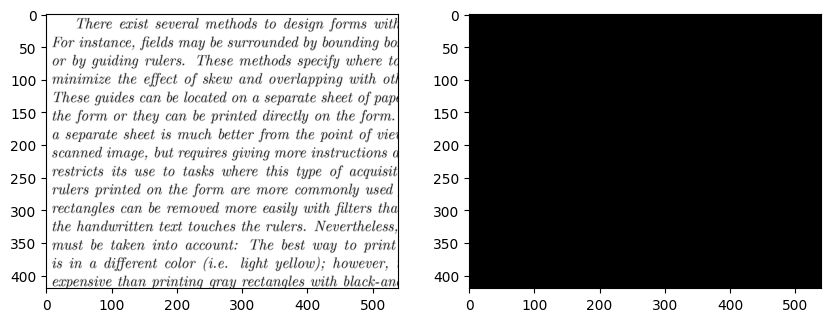

In [ ]:
## Prediction for final basic CNN model 32x32 filter configuration. It's all black despite loss reaching 0.01838.

noisy_sample, clean_sample = A.getTask3SampleImage("valid")
predicted_label = np.squeeze(autoencoder.predict(noisy_sample.reshape(1,420,540,1)))

f, ax = plt.subplots(1,2, figsize=(10,8))
ax[0].imshow(np.squeeze(clean_sample.reshape(1,420,540,1)), cmap='gray')
ax[1].imshow(np.squeeze(predicted_label.astype('int64')), cmap='gray')
plt.show()

Next we have code to compile and run the model. Please modify the code below to fit your purposes.

In [ ]:
## COMPLEX CNN - Exp 1 - 6 layers with 80x92x128 filter configuration, validation loss is 0.01827
input_img = tf.keras.layers.Input(shape=(420,540,1)) # adapt this if using `channels_first` image data format

x = tf.keras.layers.Conv2D(80, (3, 3), activation='relu', padding='same')(input_img)
print(x.shape)
x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
print(x.shape)
x = tf.keras.layers.Conv2D(92, (4, 4), activation='relu', padding='same')(x)
print(x.shape)
x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
print(x.shape)
x = tf.keras.layers.Conv2D(128, (5, 5), activation='relu', padding='same')(x)
print(x.shape)
encoded = tf.keras.layers.MaxPooling2D((3, 3), padding='same')(x)

print(encoded.shape)

# at this point the representation is (4, 4, 8) i.e. 128-dimensional
print("*"*20)
x = tf.keras.layers.Conv2D(128, (5, 5), activation='relu', padding='same')(encoded)
print(x.shape)
x = tf.keras.layers.UpSampling2D((3, 3))(x)
print(x.shape)
x = tf.keras.layers.Conv2D(92, (4, 4), activation='relu', padding = 'same')(x)
print(x.shape)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
print(x.shape)
x = tf.keras.layers.Conv2D(80, (3, 3), activation='relu', padding = 'same')(x)
print(x.shape)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
print(x.shape)
decoded = tf.keras.layers.Conv2D(1, (2, 2), activation='sigmoid', padding='same')(x)
print(decoded.shape)

autoencoder = tf.keras.models.Model(input_img, decoded)
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00012), loss=rmse_loss)
#autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.005), loss=rmse_loss)
#autoencoder.compile(optimizer='Adam', loss=rmse_loss)
autoencoder.summary()

# This will train for 50 epochs
run_name = "complex_cnn_6_layers_80x92x128_k3x4x5_b3_lr000012_rep7"
A.trainTaskThree(autoencoder,run_name, 2, epochs= 100)

(None, 420, 540, 80)
(None, 210, 270, 80)
(None, 210, 270, 92)
(None, 105, 135, 92)
(None, 105, 135, 128)
(None, 35, 45, 128)
********************
(None, 35, 45, 128)
(None, 105, 135, 128)
(None, 105, 135, 92)
(None, 210, 270, 92)
(None, 210, 270, 80)
(None, 420, 540, 80)
(None, 420, 540, 1)
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 420, 540, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 420, 540, 80)      800       
                                                                 
 max_pooling2d (MaxPooling2  (None, 210, 270, 80)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 210, 270, 92)      117852    
                                

/usr/local/lib/python3.10/dist-packages/keras/src/utils/image_utils.py:409: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn(



Epoch 1: saving model to task3/task3_001

Epoch 2: saving model to task3/task3_002

Epoch 3: saving model to task3/task3_003

Epoch 4: saving model to task3/task3_004

Epoch 5: saving model to task3/task3_005

Epoch 6: saving model to task3/task3_006

Epoch 7: saving model to task3/task3_007

Epoch 8: saving model to task3/task3_008

Epoch 9: saving model to task3/task3_009

Epoch 10: saving model to task3/task3_010

Epoch 11: saving model to task3/task3_011

Epoch 12: saving model to task3/task3_012

Epoch 13: saving model to task3/task3_013

Epoch 14: saving model to task3/task3_014

Epoch 15: saving model to task3/task3_015

Epoch 16: saving model to task3/task3_016

Epoch 17: saving model to task3/task3_017

Epoch 18: saving model to task3/task3_018

Epoch 19: saving model to task3/task3_019

Epoch 20: saving model to task3/task3_020

Epoch 21: saving model to task3/task3_021

Epoch 22: saving model to task3/task3_022

Epoch 23: saving model to task3/task3_023

Epoch 24: saving mo

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▆▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_loss,█▇▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,99
epoch/learning_rate,0.00012
epoch/loss,0.01558
epoch/val_loss,0.01827


In [ ]:
## COMPLEX CNN - FINAL MODEL - 6 layers with 86x120x144 filter configuration, final validation loss is 0.0099
input_img = tf.keras.layers.Input(shape=(420,540,1)) # adapt this if using `channels_first` image data format

x = tf.keras.layers.Conv2D(96, (3, 3), activation='relu', padding='same')(input_img)
print(x.shape)
x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
print(x.shape)
x = tf.keras.layers.Conv2D(120, (3, 3), activation='relu', padding='same')(x)
print(x.shape)
x = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
print(x.shape)
x = tf.keras.layers.Conv2D(144, (3, 3), activation='relu', padding='same')(x)
print(x.shape)
encoded = tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)

print(encoded.shape)

# at this point the representation is (4, 4, 8) i.e. 128-dimensional
print("*"*20)
x = tf.keras.layers.Conv2D(144, (3, 3), activation='relu', padding='same')(encoded)
print(x.shape)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
print(x.shape)
x = tf.keras.layers.Conv2D(120, (3, 3), activation='relu', padding = 'same')(x)
print(x.shape)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
print(x.shape)
x = tf.keras.layers.Conv2D(96, (3, 3), activation='relu')(x)
print(x.shape)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
print(x.shape)
decoded = tf.keras.layers.Conv2D(1, (2, 2), activation='sigmoid', padding = 'same')(x)
print(decoded.shape)

autoencoder = tf.keras.models.Model(input_img, decoded)
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss=rmse_loss)
#autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.005), loss=rmse_loss)
#autoencoder.compile(optimizer='Adam', loss=rmse_loss)
autoencoder.summary()

# This will train for 50 epochs
run_name = "complex_cnn_6_layers_96x120x144_k3_b2_lr0001_rep15"
A.trainTaskThree(autoencoder,run_name, 2, epochs= 100)

(None, 420, 540, 96)
(None, 210, 270, 96)
(None, 210, 270, 120)
(None, 105, 135, 120)
(None, 105, 135, 144)
(None, 53, 68, 144)
********************
(None, 53, 68, 144)
(None, 106, 136, 144)
(None, 106, 136, 120)
(None, 212, 272, 120)
(None, 210, 270, 96)
(None, 420, 540, 96)
(None, 420, 540, 1)
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 420, 540, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 420, 540, 96)      960       
                                                                 
 max_pooling2d (MaxPooling2  (None, 210, 270, 96)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 210, 270, 120)     103800    
                            

/usr/local/lib/python3.10/dist-packages/keras/src/utils/image_utils.py:409: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn(



Epoch 1: saving model to task3/task3_001

Epoch 2: saving model to task3/task3_002

Epoch 3: saving model to task3/task3_003

Epoch 4: saving model to task3/task3_004

Epoch 5: saving model to task3/task3_005

Epoch 6: saving model to task3/task3_006

Epoch 7: saving model to task3/task3_007

Epoch 8: saving model to task3/task3_008

Epoch 9: saving model to task3/task3_009

Epoch 10: saving model to task3/task3_010

Epoch 11: saving model to task3/task3_011

Epoch 12: saving model to task3/task3_012

Epoch 13: saving model to task3/task3_013

Epoch 14: saving model to task3/task3_014

Epoch 15: saving model to task3/task3_015

Epoch 16: saving model to task3/task3_016

Epoch 17: saving model to task3/task3_017

Epoch 18: saving model to task3/task3_018

Epoch 19: saving model to task3/task3_019

Epoch 20: saving model to task3/task3_020

Epoch 21: saving model to task3/task3_021

Epoch 22: saving model to task3/task3_022

Epoch 23: saving model to task3/task3_023

Epoch 24: saving mo

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▅▄▄▄▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_loss,█▆▅▅▅▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,99
epoch/learning_rate,0.0001
epoch/loss,0.00935
epoch/val_loss,0.00999


Next we can look at some predictions from the trained model.

/usr/local/lib/python3.10/dist-packages/keras/src/utils/image_utils.py:409: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn(


1/1 [==============================] - 0s 279ms/step


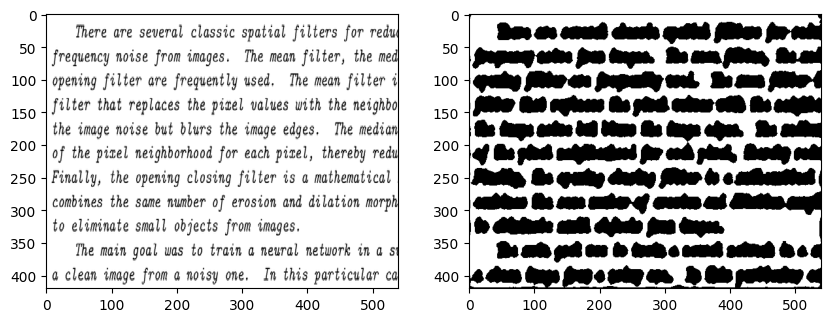

In [ ]:
# Compute the prediction
noisy_sample, clean_sample = A.getTask3SampleImage("train")
predicted_label = np.squeeze(autoencoder.predict(noisy_sample.reshape(1,420,540,1)))

f, ax = plt.subplots(1,2, figsize=(10,8))
ax[0].imshow(np.squeeze(clean_sample.reshape(1,420,540,1)), cmap='gray')
ax[1].imshow(np.squeeze(predicted_label.astype('int8')), cmap='gray')
plt.show()


1/1 [==============================] - 0s 26ms/step


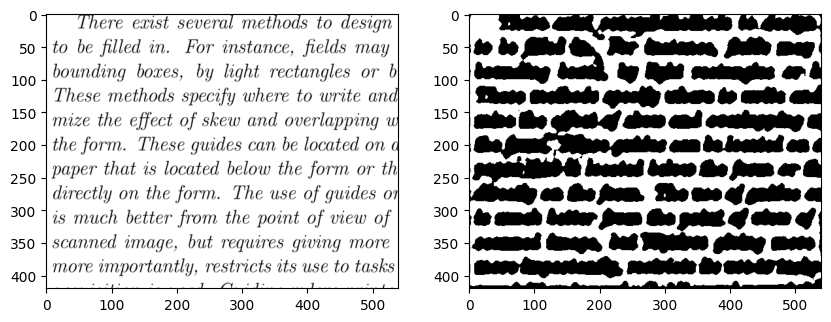

In [ ]:
# Compute the prediction
noisy_sample, clean_sample = A.getTask3SampleImage("valid")
predicted_label = np.squeeze(autoencoder.predict(noisy_sample.reshape(1,420,540,1)))

f, ax = plt.subplots(1,2, figsize=(10,8))
ax[0].imshow(np.squeeze(clean_sample.reshape(1,420,540,1)), cmap='gray')
ax[1].imshow(np.squeeze(predicted_label.astype('int64')), cmap='gray')
plt.show()

To complete this part of the project, you need to examine methods to improve the quality of the predictions. Report on methods to get better performance on this task.

In [ ]:
''' SUBMISSION '''
bestDenseModel = 'basic_dense_4_layers_64x32_ep15_final' #weight too big, 16GB. screenshot uploaded
bestSimpleCNNModel = 'basic_cnn_4_layers_32x32_kernel3x3_b8_lr00001_rep2'
bestComplexCNNModel = 'complex_cnn_6_layers_96x120x144_k3_b2_lr0001_rep15' #weights too big 1.4GB, screenshot uploaded instead
explanation = '''
The input provided this task is significantly of higher pixel counts. so computational efficiency and GPU memory constraints plays a huge role
here and it heavily influenced the choice of models.
For the dense layer model, a 4 layer dense model ('basic_dense_4_layers_64x32_ep15_final')
was tested (64x32x64x226800) with 29.2 million trainable parameters and batch size 128 and for 15 epochs. The validation loss flatlined after
10 epochs to yield a val_loss of 0.44. Any reduction in number of neurons resulted in a higher loss and increase in number of layers led to
exceeding both permissible memory quota and number of parameters.
3 experiments were done to decide on the best Simple CNN model. All 3 experiments used a 4 layer CNN model with difference in the number of
filters being used. Symmetry is followed for the encoder-decoder architecture as usual. For the 1st experiment 8x16 architecture was used
for the encoder which yielded a val_loss of 0.22. To reduce the loss, the architecture was bumped to 16x16 in the  2nd experiment with an
increase in kernel size in the 2 encoder layer from the usual (3,3) used so far to (5,5) with a goal to capture more information. this
successfully reduced the validation loss to just 0.05. In the final model deemed to the best simple CNN model
(basic_cnn_4_layers_32x32_kernel3x3_b8_lr00001_rep2'), the number of filters were increased to 32x32 configuration, with kernel sizes back to
(3,3) in all layers. Learning rate was decreased from 0.001 to 0.0001 for fine tuning, number of epochs was increased to 100 from 50 and
batch size was also decreased to 8 from 32 in comparison to the previous experiments to avoid Out-of-Memory (OOM) exception due to larger memory
requirements while training the model. This proved to be useful as the validation loss dipped to 0.0183. This model had only had 28K training
parameters which is a significant decrease from the best dense model chosen above. The loss is also considerably lower making it better than
the best dense model. However, on perfoming prediction on noisy image data, it yielded a completely black image. This meant that these filters
were still not enough to discard noise and capture required information. So, a move to a more 'complex' model was necessary.
Again for the complex model, further fine tuning was necessary and more experimentation was done. A clear increase in depth of the autoencoder
was needed. so architecture was moved from a 4-layer to a 6-layer autoencoder (3 for encoder, 3 for decoder). In the background around 15-20
models were run to arrive at the final model. To keep it clean and precise, the final 2 experiments are part of the jupyter notebook. In the
the penultimate experiment, the filters were considerably increased to 80x92x128 (encoder, decoder-symmetric) configuration, with batch size
further decreased to 2 to avoid GPU OOM exception issues. Learning rate was kept close to 0.0001. 100 epochs were used to try and achieve near
0 loss and achieved a validation loss of approx 0.018. In the final model which is the best complex CNN model ('complex_cnn_6_layers_96x120x144_k3_b2_lr0001_rep15'),
and the best model overall, the filters were changed (increased) to 96x120x144 with a similar learning rate and same number of epochs, the training was
done to yield a final validation loss of 0.00999, lower than the best simple CNN model. On performing predictions with this model,
it was considerably better than that of the simple CNN model as it was able to isolate blank white spaces in images and provided a smudged out
black block in the location of text data. This means the best model overall is 'complex_cnn_6_layers_96x120x144_k3_b2_lr0001_rep15'.
Due to GPU bottlenecks, this was the best model achievable, perhaps a better model with more filters like 128x180x256 could have done
much better job to get the loss further close to 0 and get a clearer denoised image.
The best complex CNN model and best dense model weights were too large (16GB and 1.4GB repectively) to fit in the submission tar file.
Only wandb screenshots are attached for all 3 models as proof in this jupyter notebook.
'''

A.make_submission_three(bestDenseModel, bestSimpleCNNModel, bestComplexCNNModel, explanation)

## TASK 3 - BEST DENSE MODEL

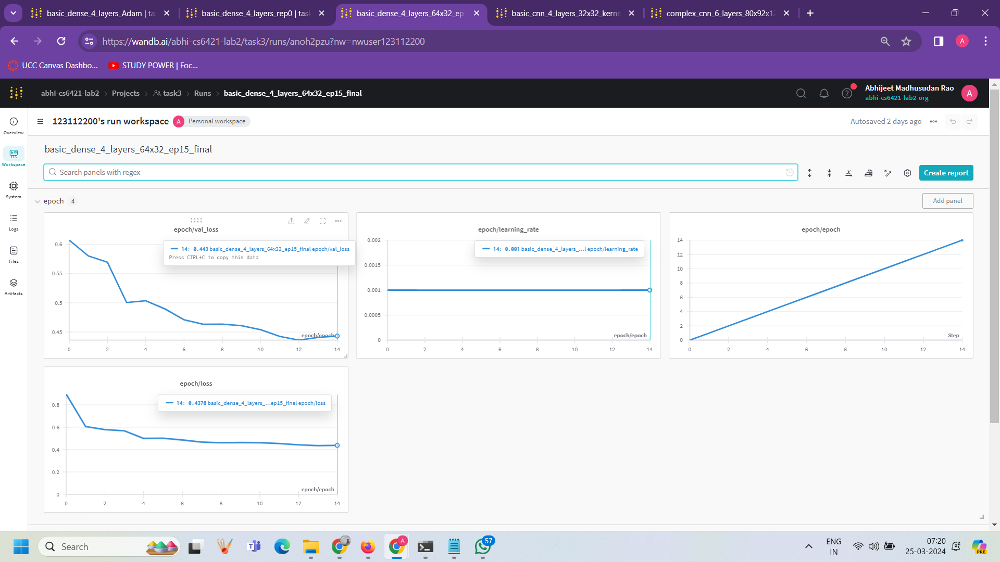

## TASK 3 - BEST SIMPLE CNN MODEL

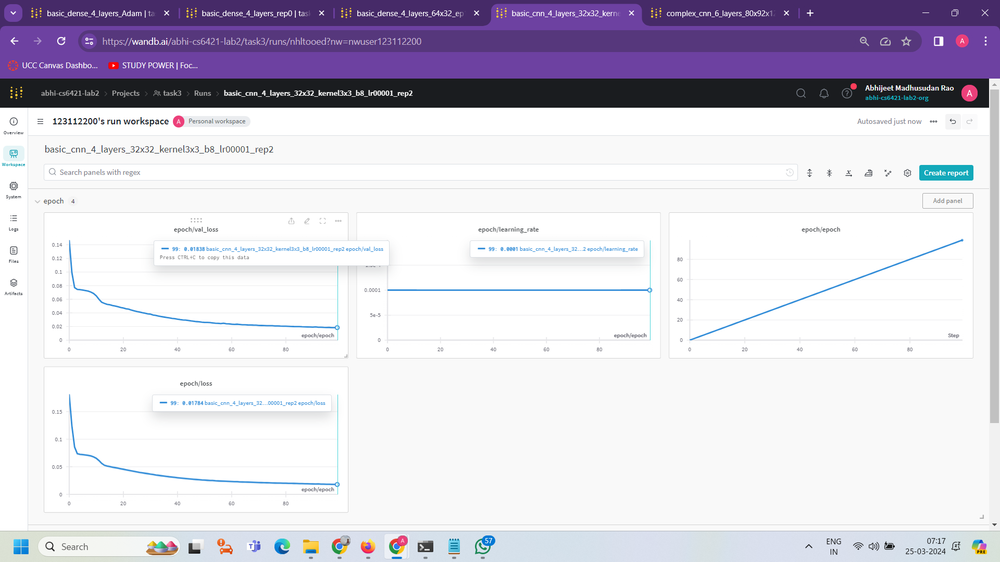

## TASK 3 - BEST COMPLEX CNN MODEL

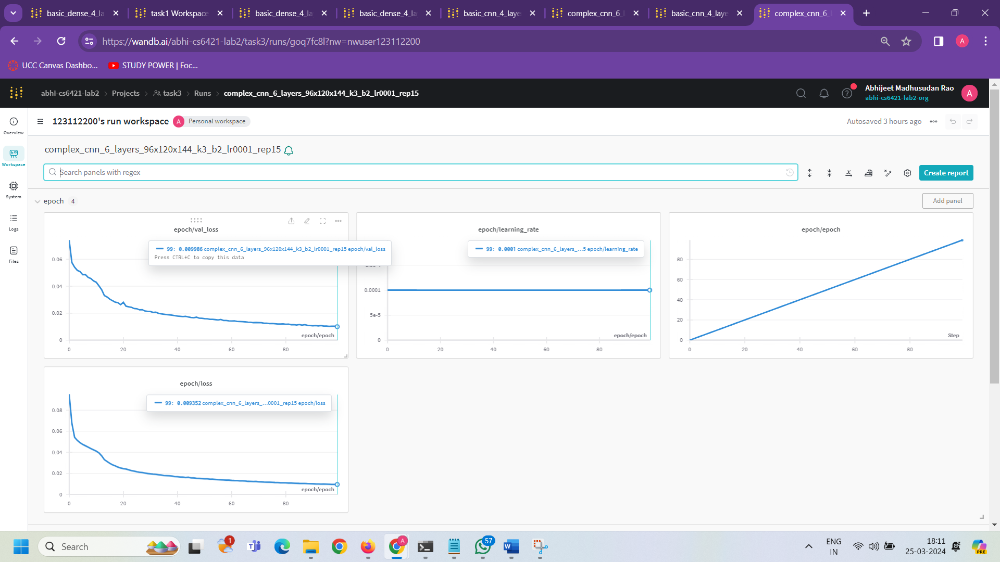

# Assignment Submission
1. Save this notebook (Ctrl+S) and download it with File->Download->Download .ipynb
2. Submit both this .ipynb and **task1.tar.gz, task2.tar.gz and task3.tar.gz** to Canvas - do not zip, tar or otherwsie combine or modify these files

## References
* Martín Abadi, Ashish Agarwal, Paul Barham, Eugene Brevdo, Zhifeng Chen, Craig Citro, Greg S. Corrado, Andy Davis, Jeffrey Dean, Matthieu Devin, Sanjay Ghemawat, Ian Goodfellow, Andrew Harp, Geoffrey Irving, Michael Isard, Rafal Jozefowicz, Yangqing Jia, Lukasz Kaiser, Manjunath Kudlur, Josh Levenberg, Dan Mané, Mike Schuster, Rajat Monga, Sherry Moore, Derek Murray, Chris Olah, Jonathon Shlens, Benoit Steiner, Ilya Sutskever, Kunal Talwar, Paul Tucker, Vincent Vanhoucke, Vijay Vasudevan, Fernanda Viégas, Oriol Vinyals, Pete Warden, Martin Wattenberg, Martin Wicke, Yuan Yu, and Xiaoqiang Zheng. TensorFlow: Large-scale machine learning on heterogeneous systems, 2015. Software available from [tensorflow.org](https://tensorflow.org/).
* Chollet, F. (2016, May 14). Building Autoencoders in Keras. Retrieved March 19, 2019, from https://blog.keras.io/building-autoencoders-in-keras.html
* Goodfellow, I., Bengio, Y., & Courville, A. (2016). Deep learning. MIT press.